In [9]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2
from tqdm import tqdm#_notebook as tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from functools import reduce
import os
from scipy.optimize import minimize
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error


PATH = '/Users/stian/Downloads/pku-autonomous-driving/'
os.listdir(PATH)

['camera.zip',
 'train_masks.zip',
 'test_images.zip',
 'train_images.zip',
 'car_models_json.zip',
 'camera_intrinsic.txt',
 'test_masks.zip',
 'train.csv',
 'car_models.zip',
 'sample_submission.csv']

# Load data

In [10]:
train = pd.read_csv(PATH + 'train.csv')
test = pd.read_csv(PATH + 'sample_submission.csv')
camera = pd.read_csv(PATH + 'camera_intrinsic.txt')
print(camera)

# From camera.zip
camera_matrix = np.array([[2304.5479, 0,  1686.2379],
                          [0, 2305.8757, 1354.9849],
                          [0, 0, 1]], dtype=np.float32)
camera_matrix_inv = np.linalg.inv(camera_matrix)

#train.head()

   fx = 2304.5479;
0  fy = 2305.8757;
1  cx = 1686.2379;
2  cy = 1354.9849;


**ImageId** column contains names of images:

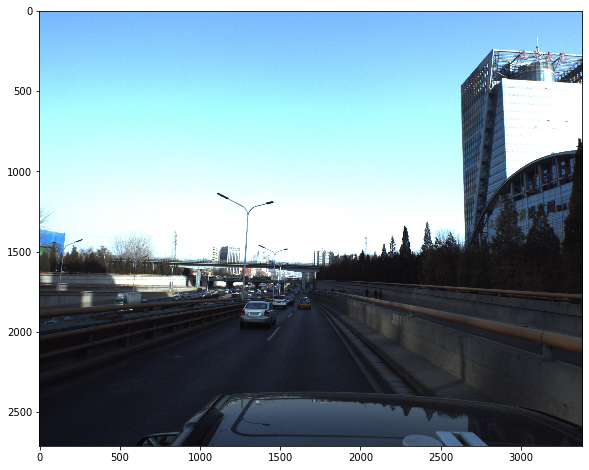

In [13]:
def imread(path, fast_mode=False):
    img = cv2.imread(path)
    if not fast_mode and img is not None and len(img.shape) == 3:
        img = np.array(img[:, :, ::-1])
    return img

img = imread(PATH + 'train_images/ID_0b0be29be' + '.jpg')
IMG_SHAPE = img.shape

plt.figure(figsize=(15,8))
plt.imshow(img);

In [14]:
def str2coords(s, names=['id', 'yaw', 'pitch', 'roll', 'x', 'y', 'z']):
    '''
    Input:
        s: PredictionString (e.g. from train dataframe)
        names: array of what to extract from the string
    Output:
        list of dicts with keys from `names`
    '''
    coords = []
    for l in np.array(s.split()).reshape([-1, 7]):
        coords.append(dict(zip(names, l.astype('float'))))
        if 'id' in coords[-1]:
            coords[-1]['id'] = int(coords[-1]['id'])
    return coords

In [15]:
inp = train['PredictionString'][0]
print('Example input:\n', inp)
print()
print('Output:\n', str2coords(inp))

Example input:
 16 0.254839 -2.57534 -3.10256 7.96539 3.20066 11.0225 56 0.181647 -1.46947 -3.12159 9.60332 4.66632 19.339 70 0.163072 -1.56865 -3.11754 10.39 11.2219 59.7825 70 0.141942 -3.1395 3.11969 -9.59236 5.13662 24.7337 46 0.163068 -2.08578 -3.11754 9.83335 13.2689 72.9323

Output:
 [{'id': 16, 'yaw': 0.254839, 'pitch': -2.57534, 'roll': -3.10256, 'x': 7.96539, 'y': 3.20066, 'z': 11.0225}, {'id': 56, 'yaw': 0.181647, 'pitch': -1.46947, 'roll': -3.12159, 'x': 9.60332, 'y': 4.66632, 'z': 19.339}, {'id': 70, 'yaw': 0.163072, 'pitch': -1.56865, 'roll': -3.11754, 'x': 10.39, 'y': 11.2219, 'z': 59.7825}, {'id': 70, 'yaw': 0.141942, 'pitch': -3.1395, 'roll': 3.11969, 'x': -9.59236, 'y': 5.13662, 'z': 24.7337}, {'id': 46, 'yaw': 0.163068, 'pitch': -2.08578, 'roll': -3.11754, 'x': 9.83335, 'y': 13.2689, 'z': 72.9323}]


# Data distributions

DataFrame of all points

In [17]:
points_df = pd.DataFrame()
for col in ['x', 'y', 'z', 'yaw', 'pitch', 'roll']:
    arr = []
    for ps in train['PredictionString']:
        coords = str2coords(ps)
        arr += [c[col] for c in coords]
    points_df[col] = arr

print('len(points_df)', len(points_df))
points_df.head()

len(points_df) 49684


,x,y,z,yaw,pitch,roll
0,7.96539,3.20066,11.0225,0.254839,-2.57534,-3.10256
1,9.60332,4.66632,19.3390,0.181647,-1.46947,-3.12159
2,10.39000,11.22190,59.7825,0.163072,-1.56865,-3.11754
3,-9.59236,5.13662,24.7337,0.141942,-3.13950,3.11969
4,9.83335,13.26890,72.9323,0.163068,-2.08578,-3.11754


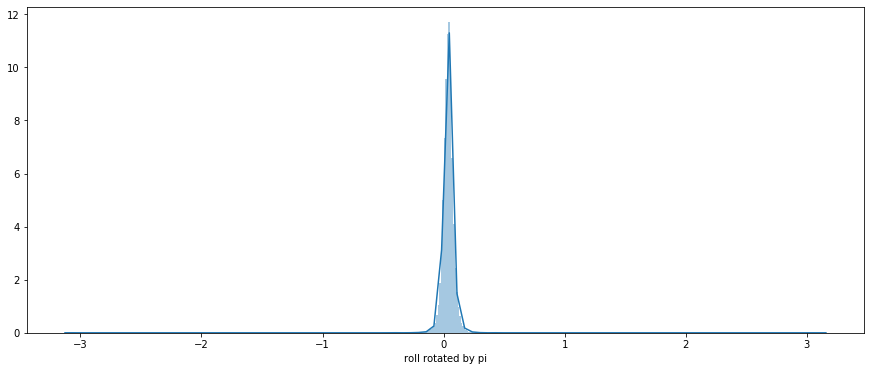

In [18]:
def rotate(x, angle):
    x = x + angle
    x = x - (x + np.pi) // (2 * np.pi) * 2 * np.pi
    return x

plt.figure(figsize=(15,6))
sns.distplot(points_df['roll'].map(lambda x: rotate(x, np.pi)), bins=500);
plt.xlabel('roll rotated by pi')
plt.show()

# 2D Visualization

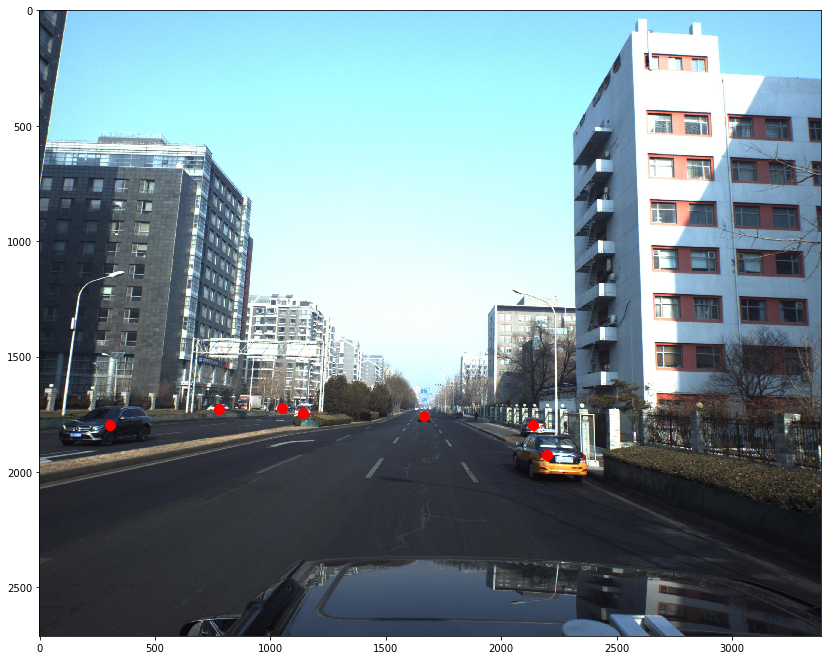

In [19]:
def get_img_coords(s):
    '''
    Input is a PredictionString (e.g. from train dataframe)
    Output is two arrays:
        xs: x coordinates in the image (row)
        ys: y coordinates in the image (column)
    '''
    coords = str2coords(s)
    xs = [c['x'] for c in coords]
    ys = [c['y'] for c in coords]
    zs = [c['z'] for c in coords]
    P = np.array(list(zip(xs, ys, zs))).T
    img_p = np.dot(camera_matrix, P).T
    img_p[:, 0] /= img_p[:, 2]
    img_p[:, 1] /= img_p[:, 2]
    img_xs = img_p[:, 0]
    img_ys = img_p[:, 1]
    img_zs = img_p[:, 2] # z = Distance from the camera
    return img_xs, img_ys

plt.figure(figsize=(14,14))
plt.imshow(imread(PATH + 'train_images/' + train['ImageId'][117] + '.jpg'))
plt.scatter(*get_img_coords(train['PredictionString'][117]), color='red', s=100);

One point is out of image!

Let's look at the distribution of all points. Image is here just for reference.

3d distribution of points:

In [21]:
fig = px.scatter_3d(points_df, x='x', y='y', z='z', range_x=(-50,50), range_y=(0,50), range_z=(0,250), opacity=0.1)
fig.show()

In [22]:
zy_slope = LinearRegression()
X = points_df[['z']]
y = points_df['y']
zy_slope.fit(X, y)
print('MAE without x:', mean_absolute_error(y, zy_slope.predict(X)))

# Will use this model later
xzy_slope = LinearRegression()
X = points_df[['x', 'z']]
y = points_df['y']
xzy_slope.fit(X, y)
print('MAE with x:', mean_absolute_error(y, xzy_slope.predict(X)))

print('\ndy/dx = {:.3f}\ndy/dz = {:.3f}'.format(*xzy_slope.coef_))

MAE without x: 0.6553782352986744
MAE with x: 0.4481661289004144

dy/dx = 0.051
dy/dz = 0.169


In [24]:
from math import sin, cos

# convert euler angle to rotation matrix
def euler_to_Rot(yaw, pitch, roll):
    Y = np.array([[cos(yaw), 0, sin(yaw)],
                  [0, 1, 0],
                  [-sin(yaw), 0, cos(yaw)]])
    P = np.array([[1, 0, 0],
                  [0, cos(pitch), -sin(pitch)],
                  [0, sin(pitch), cos(pitch)]])
    R = np.array([[cos(roll), -sin(roll), 0],
                  [sin(roll), cos(roll), 0],
                  [0, 0, 1]])
    return np.dot(Y, np.dot(P, R))

In [25]:
def draw_line(image, points):
    color = (255, 0, 0)
    cv2.line(image, tuple(points[0][:2]), tuple(points[3][:2]), color, 16)
    cv2.line(image, tuple(points[0][:2]), tuple(points[1][:2]), color, 16)
    cv2.line(image, tuple(points[1][:2]), tuple(points[2][:2]), color, 16)
    cv2.line(image, tuple(points[2][:2]), tuple(points[3][:2]), color, 16)
    return image


def draw_points(image, points):
    for (p_x, p_y, p_z) in points:
        cv2.circle(image, (p_x, p_y), int(1000 / p_z), (0, 255, 0), -1)
#         if p_x > image.shape[1] or p_y > image.shape[0]:
#             print('Point', p_x, p_y, 'is out of image with shape', image.shape)
    return image

In [26]:
def visualize(img, coords):
    # You will also need functions from the previous cells
    x_l = 1.02
    y_l = 0.80
    z_l = 2.31
    
    img = img.copy()
    for point in coords:
        # Get values
        x, y, z = point['x'], point['y'], point['z']
        yaw, pitch, roll = -point['pitch'], -point['yaw'], -point['roll']
        # Math
        Rt = np.eye(4)
        t = np.array([x, y, z])
        Rt[:3, 3] = t
        Rt[:3, :3] = euler_to_Rot(yaw, pitch, roll).T
        print(Rt[:3, :3])
        Rt = Rt[:3, :]
        P = np.array([[x_l, -y_l, -z_l, 1],
                      [x_l, -y_l, z_l, 1],
                      [-x_l, -y_l, z_l, 1],
                      [-x_l, -y_l, -z_l, 1],
                      [0, 0, 0, 1]]).T
        img_cor_points = np.dot(camera_matrix, np.dot(Rt, P))
        img_cor_points = img_cor_points.T
        img_cor_points[:, 0] /= img_cor_points[:, 2]
        img_cor_points[:, 1] /= img_cor_points[:, 2]
        img_cor_points = img_cor_points.astype(int)
        # Drawing
        img = draw_line(img, img_cor_points)
        img = draw_points(img, img_cor_points[-1:])
    
    return img

[[ 0.83799704  0.03776246  0.54436656]
 [ 0.16806832 -0.96696682 -0.19164607]
 [ 0.51914737  0.25208961 -0.81666201]]
[[-0.10472749  0.01967225  0.99430637]
 [ 0.177664   -0.98335074  0.03816834]
 [ 0.97850276  0.18064972  0.09948881]]
[[-0.00605027  0.02373126  0.99970007]
 [ 0.16225126 -0.98644779  0.02439863]
 [ 0.98673093  0.16235021  0.00211785]]
[[ 0.99976444 -0.02168065 -0.00100607]
 [-0.02160489 -0.9897057  -0.14147744]
 [ 0.00207161  0.14146585 -0.98994097]]
[[ 0.4889801   0.02373128  0.87197207]
 [ 0.1530945  -0.98644844 -0.05900473]
 [ 0.85875522  0.16234627 -0.48598679]]


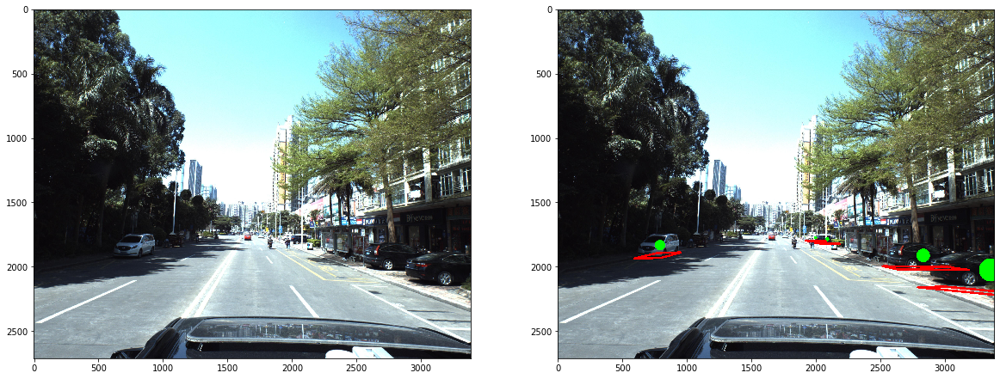

[[-0.98074831  0.02019658 -0.19422888]
 [-0.05126748 -0.98637733  0.15630551]
 [-0.18842613  0.16325399  0.96842332]]
[[ 0.98414648 -0.00206949  0.17734546]
 [ 0.0178824  -0.99367841 -0.11083065]
 [ 0.17645372  0.11224496 -0.97788811]]
[[-0.93339493  0.04044038 -0.35656484]
 [-0.10321162 -0.98189829  0.15881785]
 [-0.34368776  0.18504141  0.9206728 ]]
[[-0.97614845 -0.01945715 -0.21623048]
 [ 0.0144572  -0.99959083  0.02468113]
 [-0.21662223  0.02096636  0.97603034]]
[[ 0.95668829  0.00750691  0.29101746]
 [ 0.06356007 -0.98093592 -0.18364322]
 [ 0.28409088  0.19418641 -0.93892705]]
[[ 0.53612702  0.00186638 -0.84413526]
 [-0.16305455 -0.98093568 -0.10572802]
 [-0.82823972  0.19432374 -0.5256018 ]]
[[-0.87548243 -0.00206949 -0.48324552]
 [-0.05244127 -0.99367852  0.09926179]
 [-0.48039612  0.11224397  0.86983956]]
[[-0.91895229 -0.00608403 -0.39432178]
 [-0.03864848 -0.99367854  0.10540042]
 [-0.39247035  0.11209789  0.91290804]]


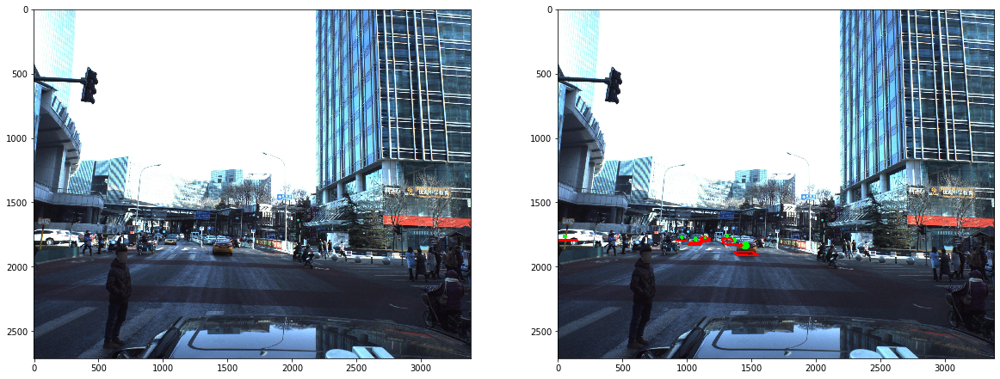

[[-0.9933041   0.11306396 -0.0237384 ]
 [-0.1154154  -0.98026598  0.16049266]
 [-0.00512401  0.1621578   0.98675154]]
[[-0.98252708  0.07725105 -0.1693305 ]
 [-0.10206784 -0.98442658  0.14313094]
 [-0.15563643  0.15791322  0.97511062]]
[[-0.81752762  0.026875   -0.57526196]
 [-0.11676363 -0.98589828  0.11987839]
 [-0.56392804  0.16517357  0.8091371 ]]
[[-0.69850454  0.04974792 -0.71387432]
 [-0.17901338 -0.97801037  0.10700437]
 [-0.69285324  0.2025361   0.69205022]]
[[-0.91300637  0.09165312 -0.39751613]
 [-0.14367816 -0.98424292  0.10306537]
 [-0.38180617  0.15121372  0.9117886 ]]
[[ 9.97984731e-01 -3.21898269e-05  6.34545094e-02]
 [ 1.06247805e-02 -9.85797490e-01 -1.67601979e-01]
 [ 6.25586912e-02  1.67938407e-01 -9.83810501e-01]]
[[ 0.99931126 -0.00960758  0.03584279]
 [-0.00399269 -0.98813297 -0.15354898]
 [ 0.03689268  0.15330011 -0.98749076]]
[[ 0.99580551  0.01848256  0.08960908]
 [ 0.03569615 -0.98025309 -0.19449848]
 [ 0.08424475  0.19688136 -0.97680118]]
[[ 0.99908951 -0.008

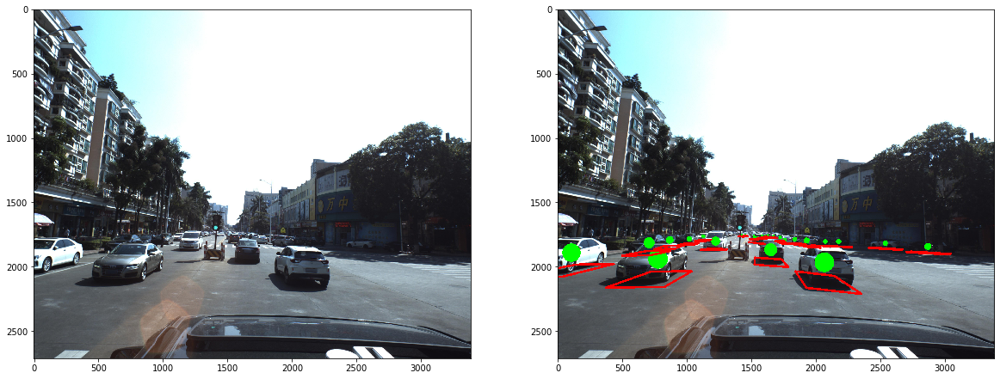

[[ 0.99434594  0.03249316  0.10109571]
 [ 0.04487995 -0.99141945 -0.12277322]
 [ 0.09623896  0.12661622 -0.9872722 ]]
[[-0.99637853  0.03249316 -0.07857499]
 [-0.04209092 -0.99141958  0.12375612]
 [-0.07387956  0.12661523  0.98919684]]
[[-0.98600787  0.03249316  0.16350132]
 [-0.01107337 -0.99141945  0.1302492 ]
 [ 0.1663306   0.12661622  0.97790719]]


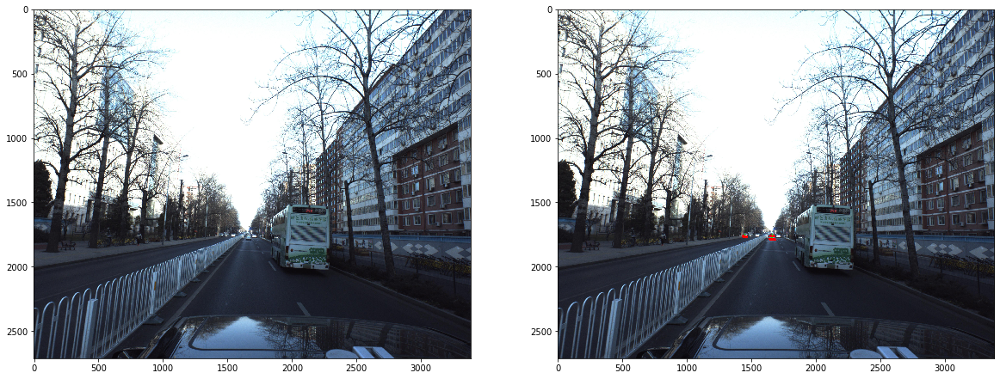

[[-0.99849159  0.05219129 -0.01704718]
 [-0.05424012 -0.9858196   0.15880093]
 [-0.00851742  0.15948603  0.98716344]]
[[-0.99697987  0.07685503 -0.01115524]
 [-0.0774685  -0.99429447  0.07332896]
 [-0.00545589  0.07397167  0.99724542]]
[[-0.99844208  0.04190748 -0.03683976]
 [-0.04810833 -0.98101214  0.18788501]
 [-0.02826647  0.1893646   0.9814999 ]]
[[-9.99064926e-01  6.03772498e-04  4.32308768e-02]
 [ 6.73976310e-03 -9.85503770e-01  1.69519601e-01]
 [ 4.27065434e-02  1.69652454e-01  9.84578182e-01]]
[[-0.99658598  0.05871094  0.05804659]
 [-0.04977666 -0.98819324  0.14490139]
 [ 0.06586855  0.14151733  0.98774196]]
[[-0.99618159  0.03664989  0.07924028]
 [-0.02385288 -0.98734359  0.15679184]
 [ 0.08398379  0.15430303  0.98444771]]
[[-0.99870099  0.04669263 -0.02039911]
 [-0.0490385  -0.98950986  0.1358877 ]
 [-0.01384017  0.13671152  0.99051421]]
[[-0.98255319 -0.03892244  0.18186336]
 [ 0.06285121 -0.9898161   0.12772554]
 [ 0.17503989  0.13692747  0.97499328]]
[[-0.81862152  0.031

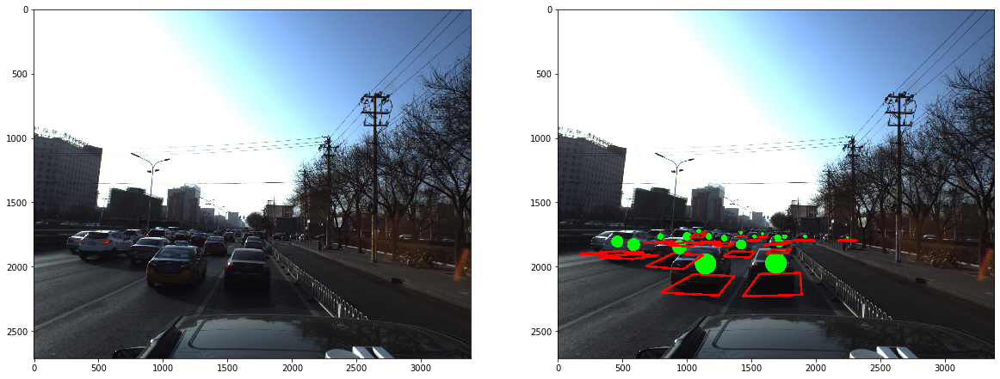

[[ 0.13427134  0.07045192 -0.98843702]
 [-0.16259461 -0.98238443 -0.0921077 ]
 [-0.9775143   0.17308196 -0.12045097]]
[[-0.98052813  0.19524002  0.02111666]
 [-0.18868723 -0.96646125  0.17421187]
 [ 0.05442157  0.16683519  0.98448175]]
[[-0.99998149  0.00136798 -0.00592925]
 [-0.00245497 -0.98227891  0.18740897]
 [-0.00556781  0.18742006  0.98226408]]


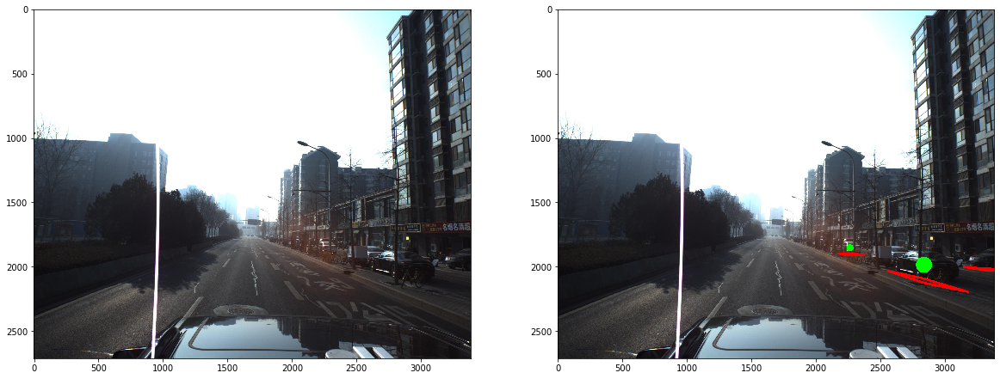

In [27]:
n_rows = 6

for idx in range(n_rows):
    fig, axes = plt.subplots(1, 2, figsize=(20,20))
    img = imread(PATH + 'train_images/' + train['ImageId'].iloc[idx] + '.jpg')
    axes[0].imshow(img)
    img_vis = visualize(img, str2coords(train['PredictionString'].iloc[idx]))
    axes[1].imshow(img_vis)
    plt.show()

# Image preprocessing

In [28]:
IMG_WIDTH = 1024
IMG_HEIGHT = IMG_WIDTH // 16 * 5
MODEL_SCALE = 8

def _regr_preprocess(regr_dict, flip=False):
    if flip:
        for k in ['x', 'pitch', 'roll']:
            regr_dict[k] = -regr_dict[k]
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] / 100
    regr_dict['roll'] = rotate(regr_dict['roll'], np.pi)
    regr_dict['pitch_sin'] = sin(regr_dict['pitch'])
    regr_dict['pitch_cos'] = cos(regr_dict['pitch'])
    regr_dict.pop('pitch')
    regr_dict.pop('id')
    return regr_dict

def _regr_back(regr_dict):
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] * 100
    regr_dict['roll'] = rotate(regr_dict['roll'], -np.pi)
    
    pitch_sin = regr_dict['pitch_sin'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    pitch_cos = regr_dict['pitch_cos'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    regr_dict['pitch'] = np.arccos(pitch_cos) * np.sign(pitch_sin)
    return regr_dict

def preprocess_image(img, flip=False):
    img = img[img.shape[0] // 2:]
    bg = np.ones_like(img) * img.mean(1, keepdims=True).astype(img.dtype)
    bg = bg[:, :img.shape[1] // 6]
    img = np.concatenate([bg, img, bg], 1)
    img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
    if flip:
        img = img[:,::-1]
    return (img / 255).astype('float32')

def get_mask_and_regr(img, labels, flip=False):
    mask = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE], dtype='float32')
    regr_names = ['x', 'y', 'z', 'yaw', 'pitch', 'roll']
    regr = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE, 7], dtype='float32')
    coords = str2coords(labels)
    xs, ys = get_img_coords(labels)
    for x, y, regr_dict in zip(xs, ys, coords):
        x, y = y, x
        x = (x - img.shape[0] // 2) * IMG_HEIGHT / (img.shape[0] // 2) / MODEL_SCALE
        x = np.round(x).astype('int')
        y = (y + img.shape[1] // 6) * IMG_WIDTH / (img.shape[1] * 4/3) / MODEL_SCALE
        y = np.round(y).astype('int')
        if x >= 0 and x < IMG_HEIGHT // MODEL_SCALE and y >= 0 and y < IMG_WIDTH // MODEL_SCALE:
            mask[x, y] = 1
            regr_dict = _regr_preprocess(regr_dict, flip)
            regr[x, y] = [regr_dict[n] for n in sorted(regr_dict)]
    if flip:
        mask = np.array(mask[:,::-1])
        regr = np.array(regr[:,::-1])
    return mask, regr

In [29]:
regr[:,:,-2]

NameError: name 'regr' is not defined

img.shape (320, 1024, 3) std: 0.29819912
mask.shape (40, 128) std: 0.031234737
regr.shape (40, 128, 7) std: 0.013211883


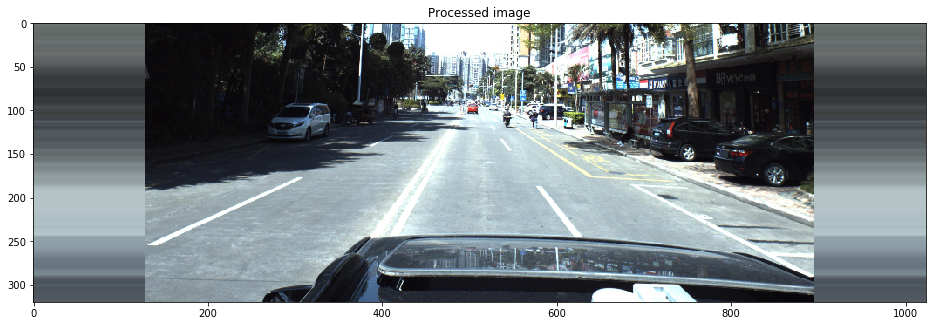

"\nplt.figure(figsize=(16,16))\nplt.title('Detection Mask')\nplt.imshow(mask)\nplt.show()\n\nplt.figure(figsize=(16,16))\nplt.title('Yaw values')\nplt.imshow(regr[:,:,-2])\nplt.show()\n\nplt.figure(figsize=(16,16))\nplt.title('Pitch values')\nplt.imshow(regr[:,:,-1])\nplt.show()\n"

In [33]:
img0 = imread(PATH + 'train_images/' + train['ImageId'][0] + '.jpg')
img = preprocess_image(img0)

mask, regr = get_mask_and_regr(img0, train['PredictionString'][0])

print('img.shape', img.shape, 'std:', np.std(img))
print('mask.shape', mask.shape, 'std:', np.std(mask))
print('regr.shape', regr.shape, 'std:', np.std(regr))

plt.figure(figsize=(16,16))
plt.title('Processed image')
plt.imshow(img)
plt.show()
"""
plt.figure(figsize=(16,16))
plt.title('Detection Mask')
plt.imshow(mask)
plt.show()

plt.figure(figsize=(16,16))
plt.title('Yaw values')
plt.imshow(regr[:,:,-2])
plt.show()

plt.figure(figsize=(16,16))
plt.title('Pitch values')
plt.imshow(regr[:,:,-1])
plt.show()
"""

Define functions to convert back from 2d map to 3d coordinates and angles

In [31]:
DISTANCE_THRESH_CLEAR = 2

def convert_3d_to_2d(x, y, z, fx = 2304.5479, fy = 2305.8757, cx = 1686.2379, cy = 1354.9849):
    # stolen from https://www.kaggle.com/theshockwaverider/eda-visualization-baseline
    return x * fx / z + cx, y * fy / z + cy

def optimize_xy(r, c, x0, y0, z0, flipped=False):
    def distance_fn(xyz):
        x, y, z = xyz
        xx = -x if flipped else x
        slope_err = (xzy_slope.predict([[xx,z]])[0] - y)**2
        x, y = convert_3d_to_2d(x, y, z)
        y, x = x, y
        x = (x - IMG_SHAPE[0] // 2) * IMG_HEIGHT / (IMG_SHAPE[0] // 2) / MODEL_SCALE
        y = (y + IMG_SHAPE[1] // 6) * IMG_WIDTH / (IMG_SHAPE[1] * 4 / 3) / MODEL_SCALE
        return max(0.2, (x-r)**2 + (y-c)**2) + max(0.4, slope_err)
    
    res = minimize(distance_fn, [x0, y0, z0], method='Powell')
    x_new, y_new, z_new = res.x
    return x_new, y_new, z_new

def clear_duplicates(coords):
    for c1 in coords:
        xyz1 = np.array([c1['x'], c1['y'], c1['z']])
        for c2 in coords:
            xyz2 = np.array([c2['x'], c2['y'], c2['z']])
            distance = np.sqrt(((xyz1 - xyz2)**2).sum())
            if distance < DISTANCE_THRESH_CLEAR:
                if c1['confidence'] < c2['confidence']:
                    c1['confidence'] = -1
    return [c for c in coords if c['confidence'] > 0]

def extract_coords(prediction, flipped=False):
    logits = prediction[0]
    regr_output = prediction[1:]
    points = np.argwhere(logits > 0)
    col_names = sorted(['x', 'y', 'z', 'yaw', 'pitch_sin', 'pitch_cos', 'roll'])
    coords = []
    for r, c in points:
        regr_dict = dict(zip(col_names, regr_output[:, r, c]))
        coords.append(_regr_back(regr_dict))
        coords[-1]['confidence'] = 1 / (1 + np.exp(-logits[r, c]))
        coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = \
                optimize_xy(r, c,
                            coords[-1]['x'],
                            coords[-1]['y'],
                            coords[-1]['z'], flipped)
    coords = clear_duplicates(coords)
    return coords

def coords2str(coords, names=['yaw', 'pitch', 'roll', 'x', 'y', 'z', 'confidence']):
    s = []
    for c in coords:
        for n in names:
            s.append(str(c.get(n, 0)))
    return ' '.join(s)

Ensure that all the forward and back transformations work consistently

[[ 0.99967471 -0.00821871 -0.02414378]
 [-0.01135837 -0.9910603  -0.1329303 ]
 [-0.02283542  0.1331613  -0.99083127]]
[[ 0.98290394  0.10088258  0.15402129]
 [ 0.12848176 -0.97499779 -0.18130569]
 [ 0.13187983  0.197995   -0.97129073]]
[[ 0.97631238  0.10088262  0.19140749]
 [ 0.13530484 -0.97499818 -0.1762701 ]
 [ 0.16883936  0.19799304 -0.9655527 ]]
[[-0.99263391  0.10088254 -0.06708678]
 [-0.11205912 -0.97499739  0.19189277]
 [-0.0460508   0.19799696  0.97912028]]
[[-0.97783649  0.1005968  -0.18361938]
 [-0.13364277 -0.97499765  0.17753647]
 [-0.16116886  0.19814104  0.96683231]]
[[-0.98901376  0.1005968  -0.10831468]
 [-0.11967677 -0.97499765  0.18723531]
 [-0.08677129  0.19814104  0.97632519]]
[[-0.97548861  0.1005968  -0.19570962]
 [-0.1358302  -0.97499765  0.17586855]
 [-0.1731246   0.19814104  0.96476318]]
[[-0.99482735  0.07726089  0.06594924]
 [-0.06564177 -0.98442581  0.16308583]
 [ 0.07752229  0.15791322  0.98440526]]
[[ 0.99060922 -0.00821871  0.13647647]
 [ 0.01010505 -0.

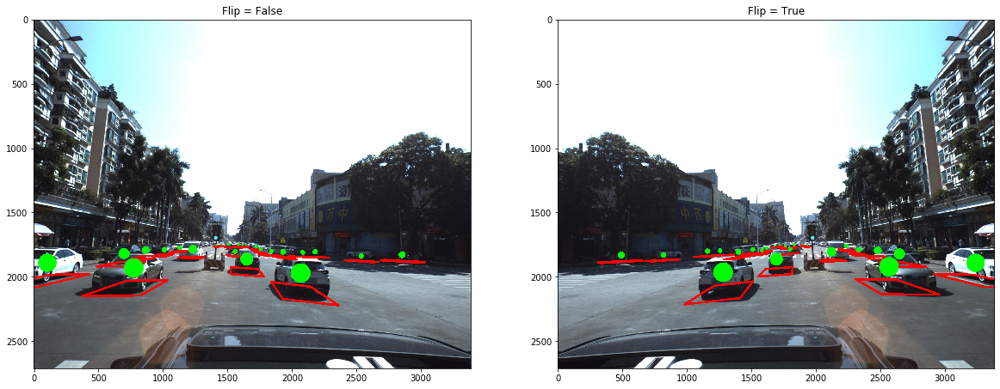

[[ 0.99434594  0.03249316  0.10109571]
 [ 0.04487995 -0.99141945 -0.12277322]
 [ 0.09623896  0.12661622 -0.9872722 ]]
[[-0.98600787  0.03249316  0.16350133]
 [-0.01107337 -0.99141945  0.1302492 ]
 [ 0.1663306   0.12661622  0.97790718]]
[[-0.98600787 -0.03249316 -0.16350133]
 [ 0.01107337 -0.99141945  0.1302492 ]
 [-0.1663306   0.12661622  0.97790718]]
[[ 0.99434594 -0.03249316 -0.10109571]
 [-0.04487995 -0.99141945 -0.12277322]
 [-0.09623896  0.12661622 -0.9872722 ]]


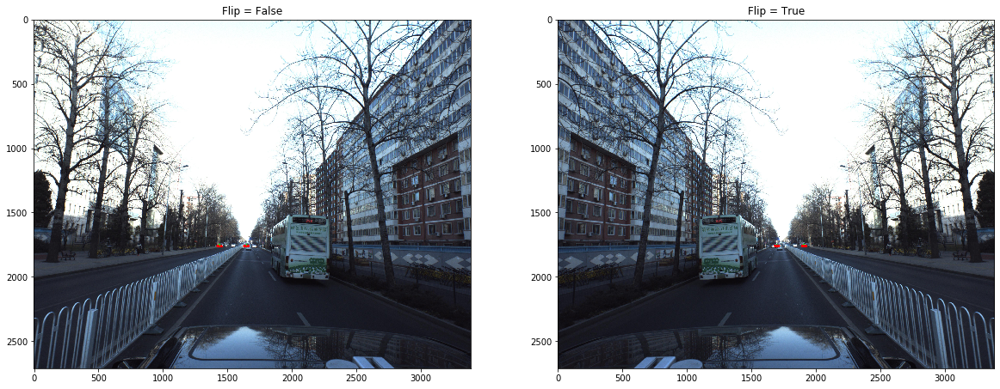

In [32]:
for idx in range(2,4):
    fig, axes = plt.subplots(1, 2, figsize=(20,20))
    
    for ax_i in range(2):
        img0 = imread(PATH + 'train_images/' + train['ImageId'].iloc[idx] + '.jpg')
        if ax_i == 1:
            img0 = img0[:,::-1]
        img = preprocess_image(img0, ax_i==1)
        mask, regr = get_mask_and_regr(img0, train['PredictionString'][idx], ax_i==1)
        regr = np.rollaxis(regr, 2, 0)
        coords = extract_coords(np.concatenate([mask[None], regr], 0), ax_i==1)
        
        axes[ax_i].set_title('Flip = {}'.format(ax_i==1))
        axes[ax_i].imshow(visualize(img0, coords))
    plt.show()